# Plotting functionalities

This notebook shows the insitupy plotting functionalities. It assumes that the previous steps of the demo notebooks such as preprocessing, import of annotations and regions and cell type annotation have been run.

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
from insitupy import InSituData, CACHE

## Load data

In [3]:
insitupy_project = Path(CACHE / "out/demo_insitupy_project")
xd = InSituData.read(insitupy_project)
xd.load_all()

In [4]:
xd

InSituData
Method:		Xenium
Slide ID:	0001879
Sample ID:	Replicate 1
Path:		C:\Users\ge37voy\.cache\InSituPy\out\demo_insitupy_project
Metadata file:	.ispy
    ➤ images
       nuclei:	(25778, 35416)
       CD20:	(25778, 35416)
       HER2:	(25778, 35416)
       HE:	(25778, 35416, 3)
    ➤ cells
       MultiCellData with main layer 'main'
           matrix
               AnnData object with n_obs × n_vars = 156447 × 297
               obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'leiden', 'cell_type_dc', 'cell_type_dc_sub', 'cell_type_tacco', 'cell_type_publ'
               var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
               uns: 'cell_type_dc_colors', 'cell_type_dc_sub', 'cell_type_dc_sub_colors', 'cell_type_publ_colors', 'cell_type_tacco_colors', 'counts_location', 'leiden', 'leiden_col

## Sample-level or experimental level plotting of expression data

In [5]:
from insitupy.plotting import plot_spatial

Using the `keys` argument, one or multiple keys can be selected to be displayed.

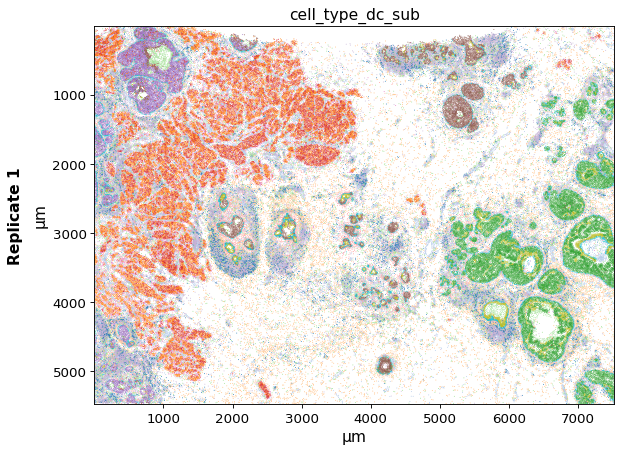

In [6]:
plot_spatial(xd, keys="cell_type_dc_sub")

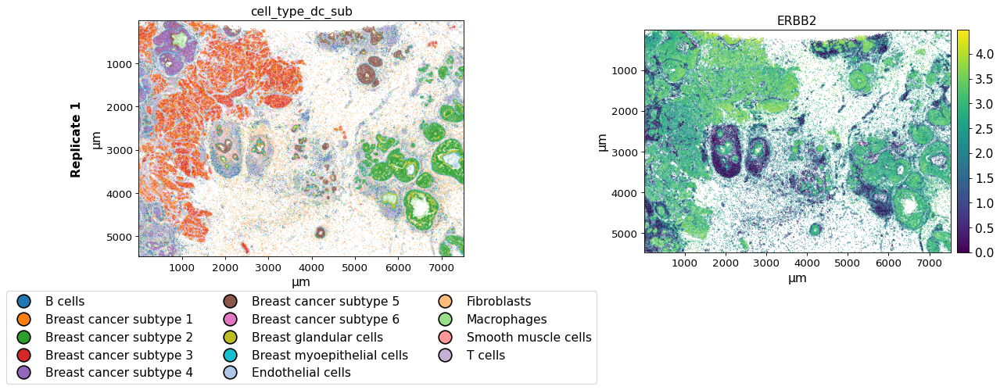

In [7]:
plot_spatial(xd, keys=["cell_type_dc_sub", "ERBB2"])

The `savepath` argument can be used to save the plot in a certain path. The filename extension determines the format of the output image. When saving as `.pdf` long saving times can occur due to the large number of data points. 

Saving figure to file figures/spatial-demo.png
Saved.


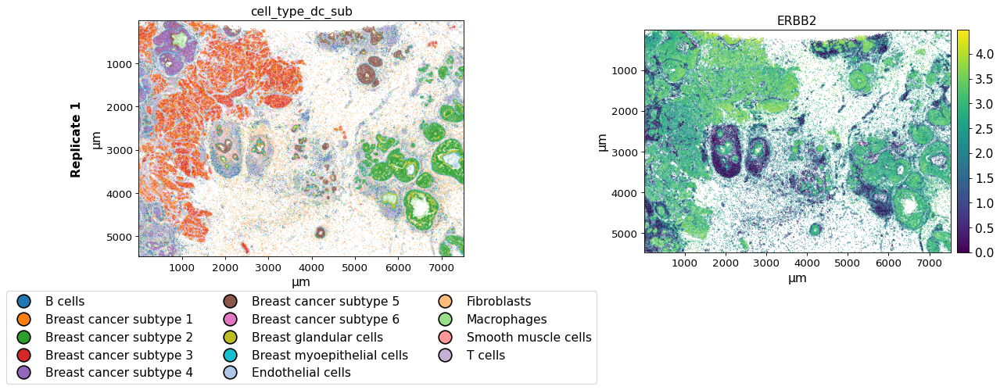

In [39]:
plot_spatial(xd, keys=["cell_type_dc_sub", "ERBB2"],
             savepath="figures/spatial-demo.png")

The `image_key` argument can be used to select a image to be displayed in the background.

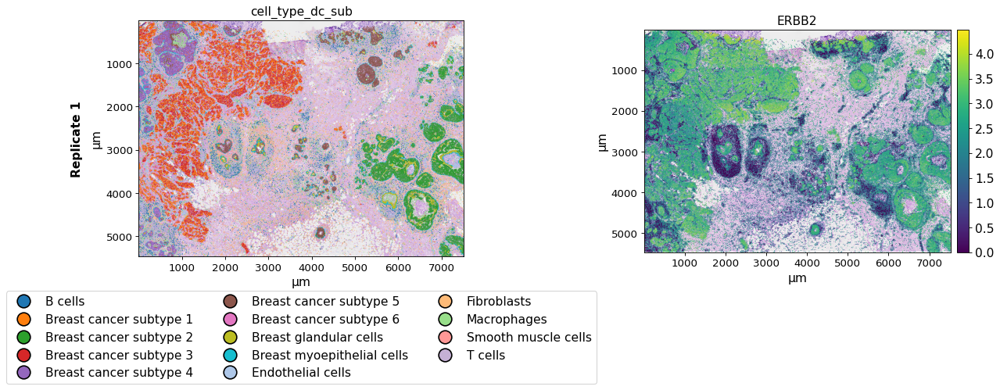

In [9]:
plot_spatial(xd, keys=["cell_type_dc_sub", "ERBB2"],
             image_key="HE",
             )

The `xlim`/`ylim` parameters can be used to zoom into the images and plot only selected regions and the `spot_size` argument to adapt the size of the spots. Further, the opacity of the spots can be adapted using `alpha`.

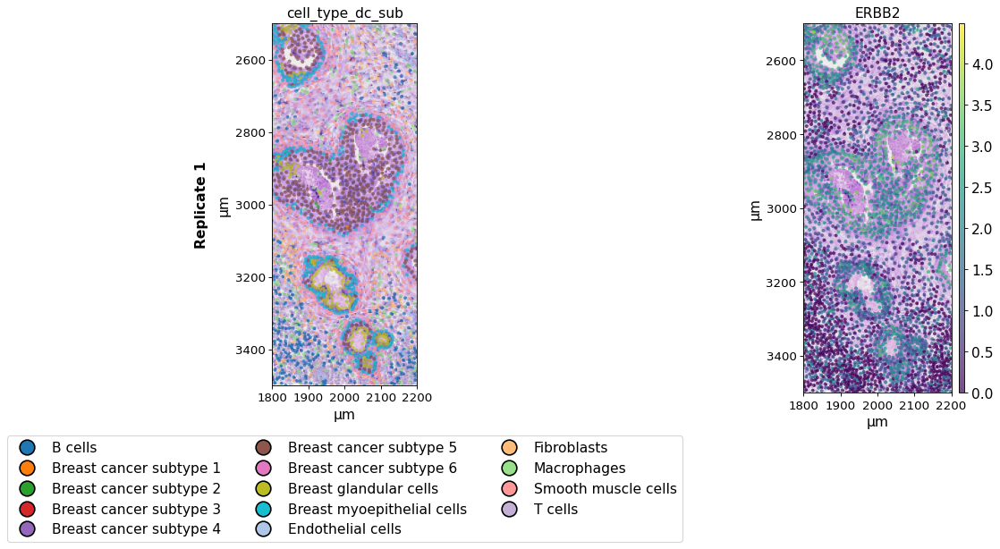

In [29]:
plot_spatial(xd, keys=["cell_type_dc_sub", "ERBB2"],
             spot_size=8, alpha=0.7,
             xlim=(1800, 2200), ylim=(2500, 3500),
             image_key="HE",
             )

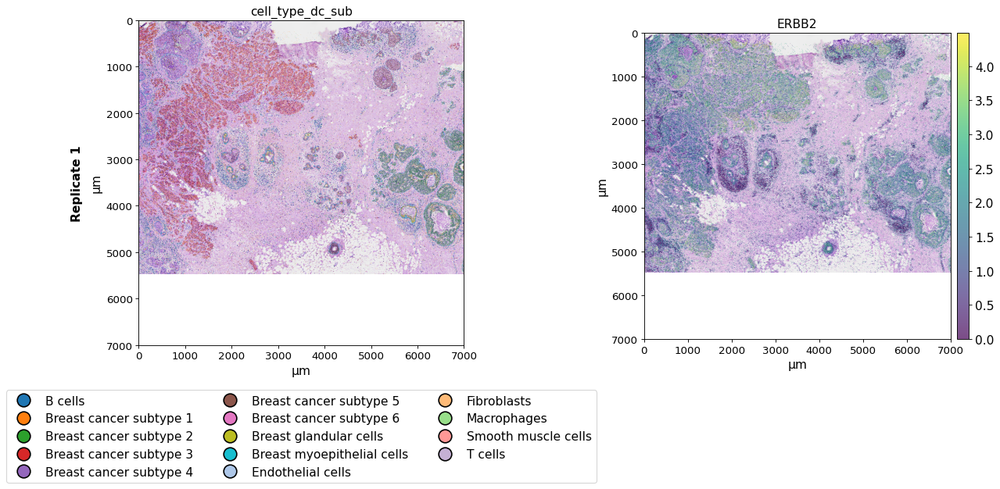

In [28]:
plot_spatial(xd, keys=["cell_type_dc_sub", "ERBB2"],
             spot_size=8, alpha=0.7,
             xlim=(0, 7000), ylim=(0, 7000),
             image_key="HE",
             )

When working with an `InSituExperiment` object for multi-sample analysis, one can directly plot all datasets within the `InSituExperiment` object. For details on generating `InSituExperiment` objects and working with them see [this notebook](../multisample_level/07_InSituPy_InSituExperiment.ipynb).

In [11]:
from insitupy import InSituExperiment

First, we generate an `InSituExperiment` object.

In [12]:
exp = InSituExperiment.from_regions(
    data=xd, region_key="TMA"
)

A-1
A-2
A-3
B-1
B-2
B-3


And then we can use the `plot_spatial` function directly on the `InSituExperiment` object. The `name_column` argument can be used to determine the column in the `.metadata` dataframe to be used for naming the plot.

In [13]:
exp.metadata

,uid,slide_id,sample_id,region_key,region_name
0,39abd0f9,0001879,Replicate 1,TMA,A-1
1,a4b97164,0001879,Replicate 1,TMA,A-2
2,bb7d859e,0001879,Replicate 1,TMA,A-3
3,b2580297,0001879,Replicate 1,TMA,B-1
4,ba9b5f9e,0001879,Replicate 1,TMA,B-2
5,80290f88,0001879,Replicate 1,TMA,B-3


When using both multiple datasets and multiple keys the plots are represented in a grid layout.

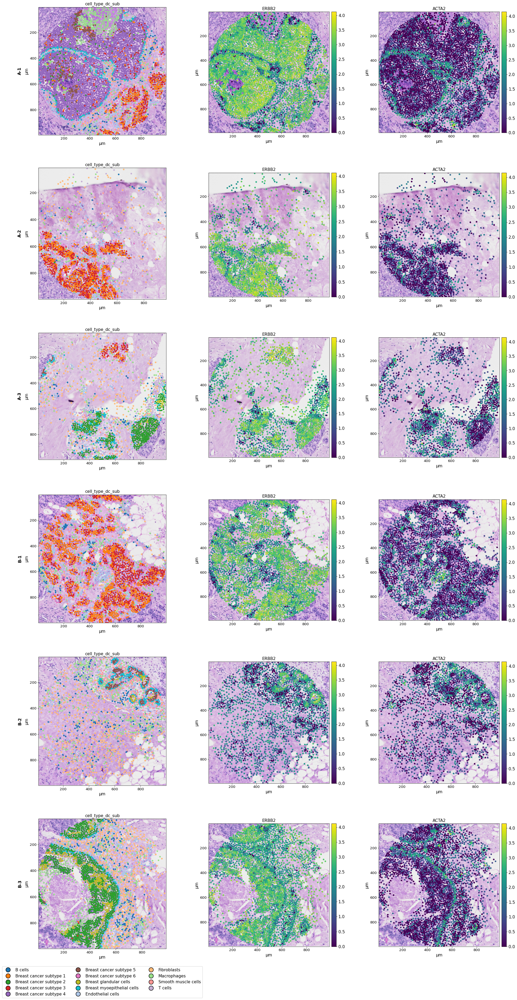

In [38]:
plot_spatial(exp, keys=["cell_type_dc_sub", "ERBB2", "ACTA2"], image_key="HE",
             name_column="region_name")

When using only multiple datasets but only one key, they are listed next to each other.

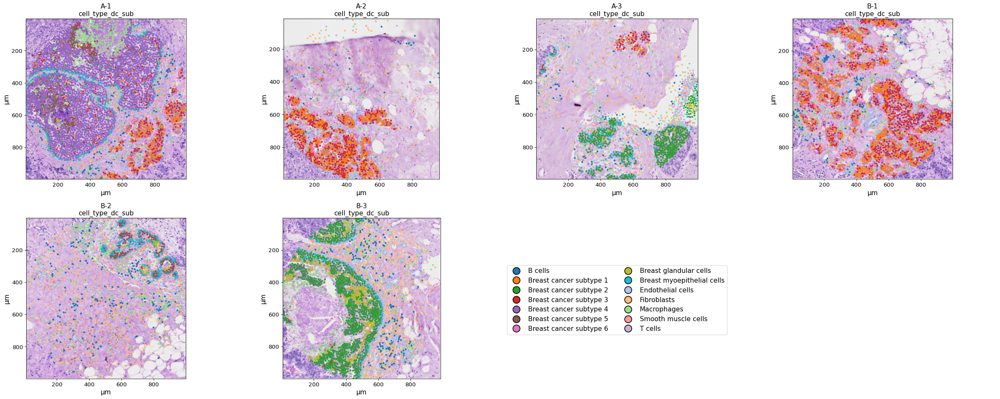

In [37]:
plot_spatial(exp, keys=["cell_type_dc_sub"], image_key="HE",
             name_column="region_name")